## Reproducing the calculation of 'stdintra' by Hélène

#### Loading datasets and crop a small region for testing:

In [1]:
import numpy as np
from dask.distributed import Client, progress
import xarray as xr
from pathlib import Path
import timeit
from dask.diagnostics import ProgressBar
# calculate climintra from extracted data
# starttime = timeit.default_timer()

expl_dir = Path('/expl6/climato/diagclim/bcs/1980_1985/tas/') # <- version double precision
expl_dir = Path('/scen3/braun/data/obs_synthese23/diagclimfloat32/bcs/1980-1985/tas/') # <- version single precision
clim_dir = Path('/scen3/braun/data/obs_synthese23/climatology/')
ds_h = xr.open_dataset(expl_dir / f'tas_bcs_01_1980_1985_stdintra.nc')
ds_ext = xr.open_dataset('/scen3/braun/data/obs_synthese23/extracted/MRCC5_ECMWF-ERAint75_OURANOS_CRCM5_historical_NAM-22_bcs_D_extracted.zarr', engine='zarr')

# reduce to 50 x 50 grid
myslice = {'rlat': slice(100, 150), 'rlon': slice(100, 150)}
myslice = {'rlat': slice(0, 300), 'rlon': slice(0, 340)}
ds_h = ds_h.isel(**myslice)
ds_ext = ds_ext.isel(**myslice)
display(ds_h)
display(ds_ext)
#client = Client(n_workers=5, threads_per_worker=2, memory_limit='10GB')

<xarray.Dataset>
Dimensions:             (time: 1, rlat: 300, rlon: 340, bnds: 2)
Coordinates:
    lat                 (rlat, rlon) float64 ...
    lon                 (rlat, rlon) float64 ...
  * rlat                (rlat) float64 -30.71 -30.49 -30.27 ... 34.85 35.07
  * rlon                (rlon) float64 -33.99 -33.77 -33.55 ... 40.37 40.59
  * time                (time) datetime64[ns] 1982-07-02T12:00:00
Dimensions without coordinates: bnds
Data variables:
    tas                 (time, rlat, rlon) float32 ...
    climatology_bounds  (time, bnds) datetime64[ns] ...
    rotated_pole        |S1 ...
Attributes:
    history_of_appended_files:  Fri Oct  6 11:30:22 2023: Appended file /exec...
    nco_openmp_thread_number:   1
    history:                    Fri Oct  6 11:30:22 2023: ncatted -a long_nam...
    NCO:                        4.6.7

<xarray.Dataset>
Dimensions:       (rlat: 300, rlon: 340, time: 20456)
Coordinates:
    lat           (rlat, rlon) float64 ...
    lon           (rlat, rlon) float64 ...
  * rlat          (rlat) float64 -30.71 -30.49 -30.27 ... 34.63 34.85 35.07
  * rlon          (rlon) float64 -33.99 -33.77 -33.55 ... 40.15 40.37 40.59
    rotated_pole  |S1 ...
  * time          (time) datetime64[ns] 1979-01-01 ... 1985-12-31T21:00:00
Data variables:
    tas           (time, rlat, rlon) float32 ...
Attributes: (12/43)
    Conventions:                    CF-1.6
    NCO:                            4.4.4
    cat:_data_format_:              nc
    cat:activity:                   MRCC5
    cat:code:                       bcs
    cat:date_end:                   1979-01-31 23:00:00
    ...                             ...
    ouranos_domain_name:            AMNO22d2 
    ouranos_run_id:                 bcs OURALIB 1.4.1
    product:                        output
    project_id:                     
    rcm_version_id:                 v3331
    reference:                      http://www.ouranos.ca

### Equations to calculate intra-monthly standard deviation:
<img src="../image/eq_stats_clim.png" alt="climate variance calculation" width="1600" height=auto/>

#### Calculate intra-monthly standard deviation from 3h values - using xarray, 'manual' implementation of the formula and xclim

In [2]:
import numpy as np
import xclim as xc
import xarray as xr
import xscen as xs

starttime = timeit.default_timer()
client = Client(n_workers=5, threads_per_worker=2, memory_limit='10GB')

# intra monthly std = std of 3h values vs daily mean
ds_ext = ds_ext.chunk({'time': -1, 'rlat': 50, 'rlon': 50})
# check if applying ddof=1 improves the result; needs to be set at var() and not at std()
#var = ds_ext.resample(time='MS').var('time', ddof=1)
#stdintra_3h = np.sqrt(var)
stdintra_3h = ds_ext.resample(time='MS').var('time')
stdintra_3h_rs = stdintra_3h.sel(time=slice('1979-12-01', '1985-11-01')).groupby('time.month').mean('time')
stdintra_3h_rs = np.sqrt(stdintra_3h_rs)
stdintra_3h_rs['tas'] = stdintra_3h_rs.tas.assign_attrs({'long_name': 'intra-monthly standard deviation of 3h temperature', 'standard_name': 'std of temperature', 'units': 'K'})

## intra monthly std = std of 3h values vs daily mean calculated 'manually' with a new coord year-month
## This is the same as the above approach using resample and map
# ds_ext = ds_ext.assign_coords(year_month=ds_ext.time.dt.strftime("%Y-%m"))
# anomalies = ds_ext.groupby("year_month") - ds_ext.groupby("year_month").mean("time")
# #anomalies = ds_ext.groupby('time.month') - ds_ext.groupby('time.month').mean('time') #<-- here is a glitch, groupby takes all months
# squared_anom = np.square(anomalies)
# var = squared_anom.resample(time='MS').mean('time')
# std1 = np.sqrt(var)
# stdintra_3h_man1 = std1.sel(time=slice('1979-12-01', '1985-11-01')).groupby('time.month').mean('time')
# stdintra_3h_man1['tas'] = stdintra_3h_man1.tas.assign_attrs({'long_name': 'intra-monthly standard deviation of 3h temperature', 'standard_name': 'std of temperature', 'units': 'K'})

# stdintra computed with xclim; requires xclim=0.45
with xc.set_options(data_validation='log', check_missing='skip'):
    stdintra_3h_xc = xc.indicators.generic.stats(ds_ext.tas, op='std', freq='MS').to_dataset()
    varintra_3h_xc = stdintra_3h_xc**2
varintra_3h_xc = varintra_3h_xc.sel(time=slice('1979-12-01', '1985-11-01')).groupby('time.month').mean('time')
stdintra_3h_xc = np.sqrt(varintra_3h_xc)
stdintra_3h_xc['stat_monthlystd'] = stdintra_3h_xc.stat_monthlystd.assign_attrs({'long_name': 'intra-monthly standard deviation of 3h temperature', 'standard_name': 'std of temperature', 'units': 'K'})
 
# # intra monthly std = std of 3h values vs daily mean calculated 'manually'
std = ds_ext.resample(time='MS').map(lambda mon: np.sqrt(((mon - mon.mean('time'))**2).mean('time')))
stdintra_3h_man = std.sel(time=slice('1979-12-01', '1985-11-01')).groupby('time.month').mean('time')
stdintra_3h_man['tas'] = stdintra_3h_man.tas.assign_attrs({'long_name': 'intra-monthly standard deviation of 3h temperature', 'standard_name': 'std of temperature', 'units': 'K'})






diff = stdintra_3h_rs - stdintra_3h_man
print(f'Diff std-function and manual calculation max = {max(abs(diff.tas.sel(month=1).values.min()), abs(diff.tas.sel(month=1).values.max()))}')
client.close()
print(f'Time elapsed: {timeit.default_timer() - starttime}')


display('standard deviation calculated by Hélène', stdintra_3h)
display('standard deviation function on resampled data', stdintra_3h_rs)
display('standard deviation calculated with xclim', stdintra_3h_xc)
# display('anomalies', anomalies)
# display('squared_anomalies', squared_anom)
# display('variance', var)
display('standard deviation', std)
display('standard deviation calculated ''manually''', stdintra_3h_man)
#display('January only', jan_stdintra)

Diff std-function and manual calculation max = 0.9839706420898438
Time elapsed: 157.53504017740488


'standard deviation calculated by Hélène'

<xarray.Dataset>
Dimensions:       (time: 84, rlat: 300, rlon: 340)
Coordinates:
    lon           (rlat, rlon) float64 dask.array<chunksize=(50, 50), meta=np.ndarray>
  * rlat          (rlat) float64 -30.71 -30.49 -30.27 ... 34.63 34.85 35.07
  * rlon          (rlon) float64 -33.99 -33.77 -33.55 ... 40.15 40.37 40.59
    rotated_pole  |S1 b''
    lat           (rlat, rlon) float64 dask.array<chunksize=(50, 50), meta=np.ndarray>
  * time          (time) datetime64[ns] 1979-01-01 1979-02-01 ... 1985-12-01
Data variables:
    tas           (time, rlat, rlon) float32 dask.array<chunksize=(84, 50, 50), meta=np.ndarray>
Attributes: (12/43)
    Conventions:                    CF-1.6
    NCO:                            4.4.4
    cat:_data_format_:              nc
    cat:activity:                   MRCC5
    cat:code:                       bcs
    cat:date_end:                   1979-01-31 23:00:00
    ...                             ...
    ouranos_domain_name:            AMNO22d2 
    ouranos_run_id:                 bcs OURALIB 1.4.1
    product:                        output
    project_id:                     
    rcm_version_id:                 v3331
    reference:                      http://www.ouranos.ca

'standard deviation function on resampled data'

<xarray.Dataset>
Dimensions:       (month: 12, rlat: 300, rlon: 340)
Coordinates:
  * rlat          (rlat) float64 -30.71 -30.49 -30.27 ... 34.63 34.85 35.07
  * rlon          (rlon) float64 -33.99 -33.77 -33.55 ... 40.15 40.37 40.59
    rotated_pole  |S1 b''
    lat           (rlat, rlon) float64 dask.array<chunksize=(50, 50), meta=np.ndarray>
    lon           (rlat, rlon) float64 dask.array<chunksize=(50, 50), meta=np.ndarray>
  * month         (month) int64 1 2 3 4 5 6 7 8 9 10 11 12
Data variables:
    tas           (month, rlat, rlon) float32 dask.array<chunksize=(12, 50, 50), meta=np.ndarray>
Attributes: (12/43)
    Conventions:                    CF-1.6
    NCO:                            4.4.4
    cat:_data_format_:              nc
    cat:activity:                   MRCC5
    cat:code:                       bcs
    cat:date_end:                   1979-01-31 23:00:00
    ...                             ...
    ouranos_domain_name:            AMNO22d2 
    ouranos_run_id:                 bcs OURALIB 1.4.1
    product:                        output
    project_id:                     
    rcm_version_id:                 v3331
    reference:                      http://www.ouranos.ca

'standard deviation calculated with xclim'

<xarray.Dataset>
Dimensions:          (month: 12, rlat: 300, rlon: 340)
Coordinates:
  * rlat             (rlat) float64 -30.71 -30.49 -30.27 ... 34.63 34.85 35.07
  * rlon             (rlon) float64 -33.99 -33.77 -33.55 ... 40.15 40.37 40.59
    rotated_pole     |S1 b''
    lat              (rlat, rlon) float64 dask.array<chunksize=(50, 50), meta=np.ndarray>
    lon              (rlat, rlon) float64 dask.array<chunksize=(50, 50), meta=np.ndarray>
  * month            (month) int64 1 2 3 4 5 6 7 8 9 10 11 12
Data variables:
    stat_monthlystd  (month, rlat, rlon) float32 dask.array<chunksize=(12, 50, 50), meta=np.ndarray>

'standard deviation'

<xarray.Dataset>
Dimensions:       (time: 84, rlat: 300, rlon: 340)
Coordinates:
    lat           (rlat, rlon) float64 dask.array<chunksize=(50, 50), meta=np.ndarray>
    lon           (rlat, rlon) float64 dask.array<chunksize=(50, 50), meta=np.ndarray>
  * rlat          (rlat) float64 -30.71 -30.49 -30.27 ... 34.63 34.85 35.07
  * rlon          (rlon) float64 -33.99 -33.77 -33.55 ... 40.15 40.37 40.59
    rotated_pole  |S1 b''
  * time          (time) datetime64[ns] 1979-01-01 1979-02-01 ... 1985-12-01
Data variables:
    tas           (time, rlat, rlon) float32 dask.array<chunksize=(1, 50, 50), meta=np.ndarray>

'standard deviation calculated manually'

<xarray.Dataset>
Dimensions:       (month: 12, rlat: 300, rlon: 340)
Coordinates:
    lon           (rlat, rlon) float64 dask.array<chunksize=(50, 50), meta=np.ndarray>
  * rlat          (rlat) float64 -30.71 -30.49 -30.27 ... 34.63 34.85 35.07
  * rlon          (rlon) float64 -33.99 -33.77 -33.55 ... 40.15 40.37 40.59
    rotated_pole  |S1 b''
    lat           (rlat, rlon) float64 dask.array<chunksize=(50, 50), meta=np.ndarray>
  * month         (month) int64 1 2 3 4 5 6 7 8 9 10 11 12
Data variables:
    tas           (month, rlat, rlon) float32 dask.array<chunksize=(1, 50, 50), meta=np.ndarray>

In [ ]:
# intra monthly std calculated from obsflow results (from indicators
pcat = xs.ProjectCatalog('/scen3/braun/data/obs_synthese23/pcat_obs.json')
ds_dict = pcat.search(processing_level='indicators').to_dataset_dict()
stdintra_3h_obsflow = ds_dict['MRCC5_ECMWF-ERAint75_OURANOS_CRCM5_historical_NAM-22_bcs.NAM-22.indicators.MS']['tg_stdintra'].isel(**myslice)
varintra_3h_obsflow = stdintra_3h_obsflow**2
varintra_3h_obsflow = varintra_3h_obsflow.sel(time=slice('1979-12-01', '1985-11-01')).groupby('time.month').mean('time')
stdintra_3h_obsflow = np.sqrt(varintra_3h_obsflow)  
stdintra_3h_obsflow = stdintra_3h_obsflow.assign_attrs({'long_name': 'intra-monthly standard deviation of 3h temperature', 'standard_name': 'std of temperature', 'units': 'K'})

#### How can 'stdintra' be computed in xclim?

/exec/braun/.conda/envs/obsflow/lib/python3.9/site-packages/distributed/node.py:182: UserWarning: Port 8787 is already in use.
Perhaps you already have a cluster running?
Hosting the HTTP server on port 34713 instead
  warnings.warn(


array([ 7.6621103,  6.8547764,  6.170029 ,  6.753078 ,  7.6313267,
        8.061942 ,  6.0945053,  6.9354815,  7.2506366,  8.201895 ,
        6.740312 ,  7.0015   , 10.263879 ,  6.9354334,  5.455299 ,
        8.764762 ,  6.4004955,  6.746799 ,  6.1161175,  6.5788126,
        6.7116213,  9.293324 ,  8.431777 ,  7.2349243,  6.1248183,
        8.963778 ,  5.6280093,  6.4936824,  6.185127 ,  6.6685667,
        6.7831354,  6.607589 ,  6.485744 ,  6.957748 ,  6.4801884,
        7.460417 ,  8.523291 , 11.03955  ,  6.1041474,  7.4931087,
        5.9972   ,  5.796733 ,  6.2182918,  6.006868 ,  8.731922 ,
        5.9122205,  6.784988 ,  7.5225167,  7.167796 ,  6.617735 ,
        6.1806984,  6.9231534,  7.320882 ,  6.311475 ,  6.491997 ,
        6.126084 ,  7.988616 ,  6.050951 ,  8.335906 , 10.904664 ,
        8.432579 ,  6.4828405,  5.186374 ,  5.929614 ,  7.4191403,
        7.285769 ,  5.98087  ,  5.4449267, 10.133481 ,  8.34808  ,
        5.5068173,  6.9404216,  7.4652014,  9.311471 ,  6.5060

'standard deviation calculated by xclim'

<xarray.DataArray 'stat_monthlystd' (time: 84, rlat: 50, rlon: 50)>
array([[[7.639469 , 6.8752346, 6.857559 , ..., 5.963351 , 5.6736326,
         5.6363916],
        [7.8310423, 6.104578 , 7.5925026, ..., 5.811047 , 5.6379843,
         5.443192 ],
        [6.5295653, 7.526024 , 7.078893 , ..., 5.808962 , 6.040523 ,
         5.5833864],
        ...,
        [5.9301744, 7.653906 , 6.1680136, ..., 5.728281 , 5.171379 ,
         5.811085 ],
        [7.0948505, 6.9263425, 6.316067 , ..., 5.017315 , 5.4433484,
         5.053754 ],
        [5.746486 , 6.714867 , 6.5518155, ..., 5.8801036, 5.9139795,
         5.46911  ]],

       [[8.592252 , 8.070772 , 8.030826 , ..., 8.115609 , 8.16499  ,
         8.076217 ],
        [8.890457 , 6.703031 , 9.114843 , ..., 8.106133 , 8.117004 ,
         7.8244553],
        [7.0350776, 8.4999485, 7.5093007, ..., 8.156464 , 8.278827 ,
         8.037033 ],
...
        [8.397079 , 9.340451 , 8.973835 , ..., 8.642594 , 8.334413 ,
         8.481663 ],
        [8.989423 , 9.19222  , 9.176664 , ..., 8.433793 , 8.530642 ,
         8.163071 ],
        [8.882062 , 9.478984 , 9.756321 , ..., 8.380793 , 8.3037405,
         8.112733 ]],

       [[8.297844 , 7.7638135, 6.9591603, ..., 7.3271165, 7.034894 ,
         6.9495087],
        [8.334346 , 6.711811 , 8.651171 , ..., 7.327615 , 7.334725 ,
         6.9237833],
        [6.893101 , 8.553453 , 7.656684 , ..., 7.4201555, 7.5330453,
         7.2871413],
        ...,
        [5.6666265, 6.032209 , 5.173683 , ..., 7.9215417, 7.602879 ,
         8.211645 ],
        [6.152562 , 5.9826784, 5.873764 , ..., 7.543727 , 7.9681287,
         7.52527  ],
        [5.2787642, 6.0260057, 6.2040076, ..., 8.082124 , 7.9516935,
         7.6781974]]], dtype=float32)
Coordinates:
    lon           (rlat, rlon) float64 -112.0 -111.8 -111.5 ... -99.2 -98.86
  * rlat          (rlat) float64 -8.71 -8.49 -8.27 -8.05 ... 1.41 1.63 1.85 2.07
  * rlon          (rlon) float64 -11.99 -11.77 -11.55 ... -1.65 -1.43 -1.21
    rotated_pole  |S1 b''
    lat           (rlat, rlon) float64 37.63 37.67 37.71 ... 49.54 49.55 49.56
  * time          (time) datetime64[ns] 1979-01-01 1979-02-01 ... 1985-12-01
Attributes:
    cell_measures:  area: areacella
    cell_methods:   time: point
    grid_mapping:   rotated_pole
    level_desc:     Height
    long_name:      Daily statistics
    realm:          atmos
    standard_name:  air_temperature
    units:          K
    history:        [2023-10-09 13:24:39] stat_monthlystd: STATS(da=tas, op='...
    description:    Monthly standard deviation of daily values (monthly).

2023-10-09 13:26:31,552 - distributed.worker - ERROR - Failed to communicate with scheduler during heartbeat.
Traceback (most recent call last):
  File "/exec/braun/.conda/envs/obsflow/lib/python3.9/site-packages/distributed/comm/tcp.py", line 225, in read
    frames_nbytes = await stream.read_bytes(fmt_size)
tornado.iostream.StreamClosedError: Stream is closed

The above exception was the direct cause of the following exception:

Traceback (most recent call last):
  File "/exec/braun/.conda/envs/obsflow/lib/python3.9/site-packages/distributed/worker.py", line 1257, in heartbeat
    response = await retry_operation(
  File "/exec/braun/.conda/envs/obsflow/lib/python3.9/site-packages/distributed/utils_comm.py", line 434, in retry_operation
    return await retry(
  File "/exec/braun/.conda/envs/obsflow/lib/python3.9/site-packages/distributed/utils_comm.py", line 413, in retry
    return await coro()
  File "/exec/braun/.conda/envs/obsflow/lib/python3.9/site-packages/distributed/core.py"

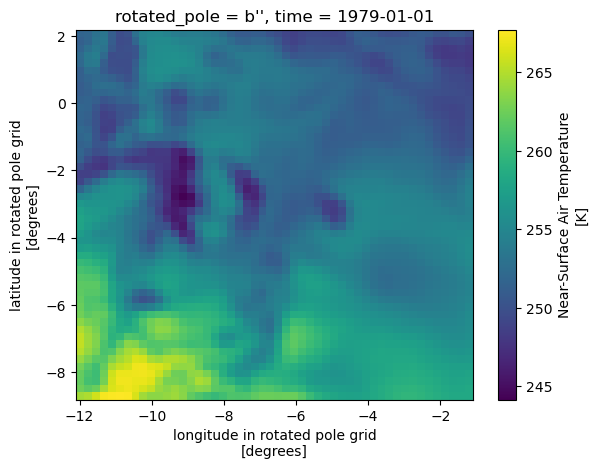

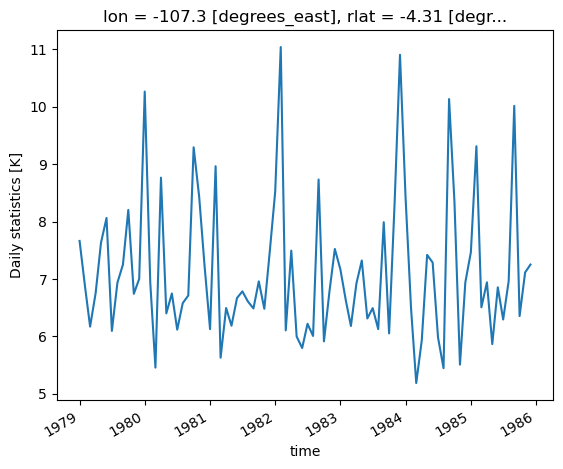

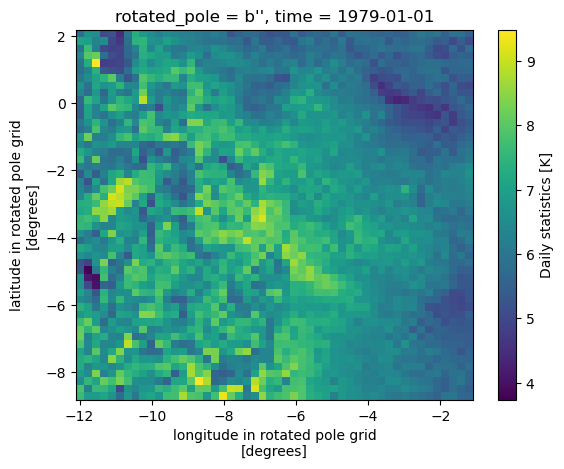

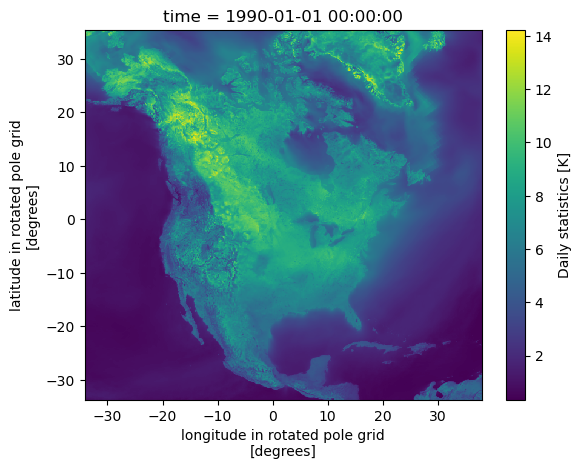

In [23]:
import matplotlib.pyplot as plt
client = Client(n_workers=5, threads_per_worker=2, memory_limit='10GB')
# let's see the data first
ds_ext.tas.isel(time=0).plot()

with xc.set_options(data_validation='log', check_missing='skip'):
    stdintra_3h_xc = xc.generic.stats(ds_ext.tas, op='std', freq='MS')
plt.figure()
stdintra_3h_xc.isel(rlat=20, rlon=20).plot()
display(stdintra_3h_xc.isel(rlat=20, rlon=20).values)
display('standard deviation calculated by xclim', stdintra_3h_xc)
plt.figure()
stdintra_3h_xc.isel(time=0).plot()

# a quick example to check what xclim produces
import xarray as xr
da = xr.open_dataset('/tank/climato/arch/cak/series/199001/tas_cak_199001_se.nc').tas
with xc.set_options(data_validation='log', check_missing='skip'):
    out = xc.generic.stats(da, op='std', freq='MS')
client.close()
plt.figure()
out.plot()

#### Compare the results of the different approaches of calculating 'stdintra'

Diff std function abs max = 0.0006632804870605469
Diff manual calculation abs max = 0.00066375732421875


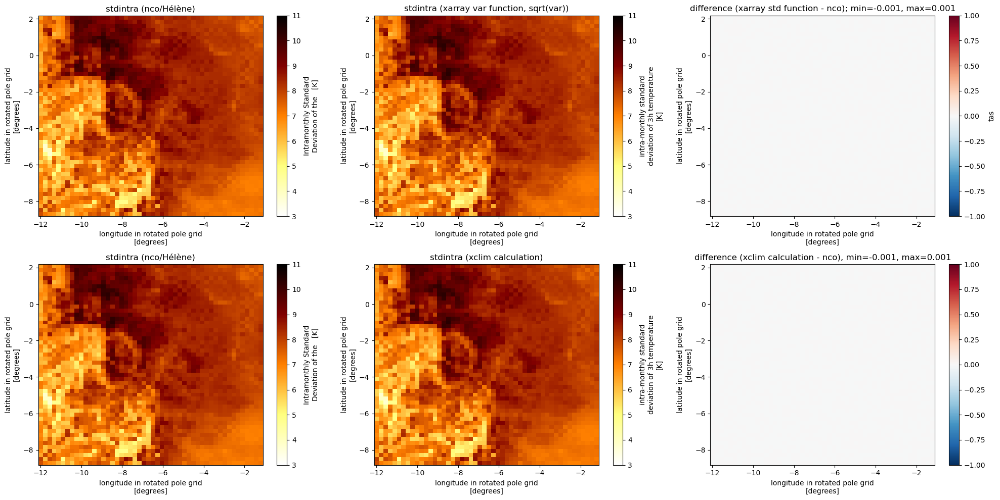

In [15]:
import matplotlib.pyplot as plt
from datetime import datetime

ds_h = xr.open_dataset(expl_dir / f'tas_bcs_01_1980_1985_stdintra.nc')
ds_h = ds_h.isel(**myslice)

fig, ax = plt.subplots(2, 3, figsize=(20, 10))

eval1 = stdintra_3h_rs.tas.sel(month=1) - ds_h['tas'].isel(time=0)
print(f'Diff std function abs max = {max(abs(eval1.values.min()), abs(eval1.values.max()))}')
ds_h['tas'].isel(time=0).plot(ax=ax[0, 0], cmap='afmhot_r', vmin=3, vmax=11)
ax[0,0].set_title('stdintra (nco/Hélène)')
stdintra_3h_rs.tas.sel(month=1).plot(ax=ax[0, 1], cmap='afmhot_r', vmin=3, vmax=11)
ax[0,1].set_title('stdintra (xarray var function, sqrt(var))')
eval1.plot(ax=ax[0,2], vmin=-1, vmax=1, cmap='RdBu_r')
ax[0,2].set_title(f'difference (xarray std function - nco); min={eval1.values.min():.3f}, max={eval1.values.max():.3f}')

eval2 = stdintra_3h_xc.stat_monthlystd.sel(month=1) - ds_h['tas'].isel(time=0)
print(f'Diff manual calculation abs max = {max(abs(eval2.values.min()), abs(eval2.values.max()))}')
ds_h['tas'].isel(time=0).plot(ax=ax[1, 0], cmap='afmhot_r', vmin=3, vmax=11)
ax[1,0].set_title('stdintra (nco/Hélène)')
stdintra_3h_xc.stat_monthlystd.sel(month=1).plot(ax=ax[1, 1], cmap='afmhot_r', vmin=3, vmax=11)
ax[1,1].set_title('stdintra (xclim calculation)')
eval2.plot(ax=ax[1,2], vmin=-1, vmax=1, cmap='RdBu_r')
ax[1,2].set_title(f'difference (xclim calculation - nco), min={eval2.values.min():.3f}, max={eval2.values.max():.3f}')

fig.tight_layout()
plt.savefig(f'/scen3/braun/data/obs_synthese23/image/checks/stdintra_check_{datetime.now().strftime("%Y%m%d%H%M")}.png')

#### Do the comparison for each month

/exec/braun/.conda/envs/obsflow/lib/python3.9/site-packages/distributed/node.py:182: UserWarning: Port 8787 is already in use.
Perhaps you already have a cluster running?
Hosting the HTTP server on port 40694 instead
  warnings.warn(


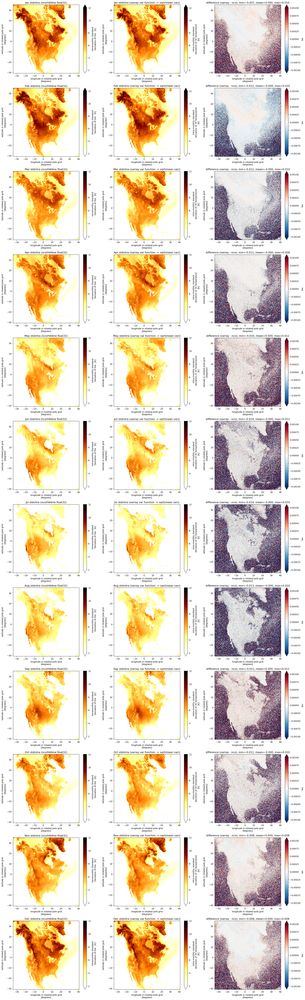

In [5]:
import matplotlib.pyplot as plt
from datetime import datetime

client = Client(n_workers=5, threads_per_worker=2, memory_limit='10GB')
fig, ax = plt.subplots(12, 3, figsize=(20, 65))
months = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']
for m in range(1,13):
    ds_h = xr.open_dataset(expl_dir / f'tas_bcs_{m:02d}_1980_1985_stdintra.nc')
    ds_h = ds_h.isel(**myslice)
    diff = stdintra_3h_rs.tas.sel(month=m) - ds_h['tas'].isel(time=0)
    vmin, vmax = 2, 12
    ds_h['tas'].isel(time=0).plot(ax=ax[m-1, 0], cmap='afmhot_r', vmin=vmin, vmax=vmax)
    ax[m-1,0].set_title(f'{months[m-1]} stdintra (nco/Hélène float32)')
    stdintra_3h_rs.tas.sel(month=m).plot(ax=ax[m-1, 1], cmap='afmhot_r', vmin=vmin, vmax=vmax)
    ax[m-1,1].set_title(f'{months[m-1]} stdintra (xarray var function -> sqrt(mean var))')
    diff.plot(ax=ax[m-1,2], vmin=-0.001, vmax=0.001, cmap='RdBu_r')
    ax[m-1,2].set_title(f'difference (xarray - nco); min={diff.values.min():.3f}, mean={diff.values.mean():.3f}, max={diff.values.max():.3f}')
fig.tight_layout()
plt.savefig(f'/scen3/braun/data/obs_synthese23/image/checks/stdintra_check_allMonths_{datetime.now().strftime("%Y%m%d%H%M")}.png')
client.close()

#### Check stdclim calculation as the srt of the sum of the squares of stdintra and stdinter

/exec/braun/.conda/envs/obsflow/lib/python3.9/site-packages/distributed/node.py:182: UserWarning: Port 8787 is already in use.
Perhaps you already have a cluster running?
Hosting the HTTP server on port 45006 instead
  warnings.warn(


'stdclim check'

<xarray.DataArray 'tas' (time: 1, rlat: 300, rlon: 340)>
array([[[0.73263827, 0.73143362, 0.73284402, ..., 3.33109585,
         3.2533375 , 3.30500159],
        [0.76218146, 0.75917248, 0.74757516, ..., 3.42824136,
         3.50141891, 3.39688979],
        [0.74936097, 0.74859041, 0.74408877, ..., 3.30593254,
         3.45051724, 3.53150343],
        ...,
        [3.47878276, 3.61842958, 4.08170444, ..., 1.65636796,
         1.6954511 , 2.28667634],
        [3.69866225, 4.03931621, 3.81462271, ..., 1.89894355,
         2.13530765, 1.89741699],
        [3.6214039 , 3.97395949, 3.97378768, ..., 3.6275521 ,
         3.44197794, 1.78417865]]])
Coordinates:
    lat      (rlat, rlon) float64 10.4 10.48 10.56 10.64 ... 58.15 57.99 57.82
    lon      (rlat, rlon) float64 -126.3 -126.1 -125.9 ... -6.894 -6.746 -6.599
  * rlat     (rlat) float64 -30.71 -30.49 -30.27 -30.05 ... 34.63 34.85 35.07
  * rlon     (rlon) float64 -33.99 -33.77 -33.55 -33.33 ... 40.15 40.37 40.59
  * time     (time) datetime64[ns] 1982-10-30T20:00:00

'diff'

<xarray.DataArray 'tas' (rlat: 300, rlon: 340)>
array([[ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00, ...,
         0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
       [ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00, ...,
         0.00000000e+00,  4.44089210e-16,  0.00000000e+00],
       [ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00, ...,
         0.00000000e+00,  4.44089210e-16,  0.00000000e+00],
       ...,
       [ 0.00000000e+00,  4.44089210e-16,  0.00000000e+00, ...,
         0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
       [ 4.44089210e-16, -8.88178420e-16,  0.00000000e+00, ...,
         0.00000000e+00,  0.00000000e+00, -2.22044605e-16],
       [ 4.44089210e-16, -4.44089210e-16,  0.00000000e+00, ...,
        -4.44089210e-16,  0.00000000e+00,  0.00000000e+00]])
Coordinates:
    lat      (rlat, rlon) float64 10.4 10.48 10.56 10.64 ... 58.15 57.99 57.82
    lon      (rlat, rlon) float64 -126.3 -126.1 -125.9 ... -6.894 -6.746 -6.599
  * rlat     (rlat) float64 -30.71 -30.49 -30.27 -30.05 ... 34.63 34.85 35.07
  * rlon     (rlon) float64 -33.99 -33.77 -33.55 -33.33 ... 40.15 40.37 40.59
    time     datetime64[ns] 1982-10-30T20:00:00

Diff stdclim min = -1.7763568394002505e-15, mean = -2.851749337762657e-19, max = 1.7763568394002505e-15


Text(0.5, 1.0, 'difference stdclim - stdclim_check')

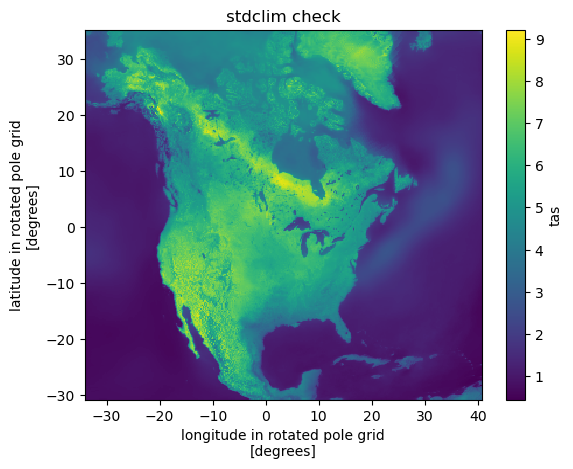

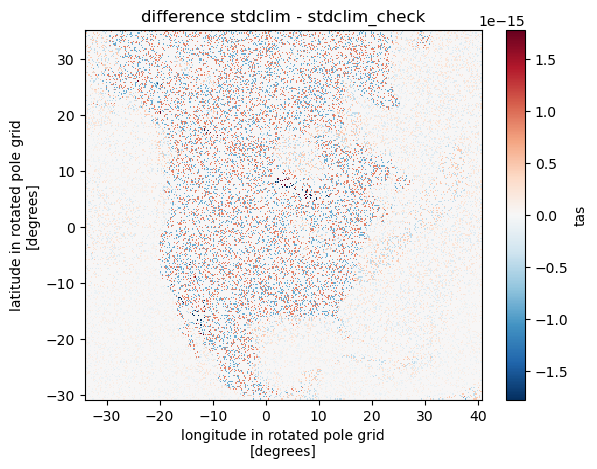

In [9]:
from dask.distributed import Client
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path

client = Client(n_workers=5, threads_per_worker=2, memory_limit='10GB')
expl_dir = Path('/expl6/climato/diagclim/bcs/1980_1985/tas/')
my_slice = {'rlat': slice(100, 150), 'rlon': slice(100, 150)}
my_slice = {'rlat': slice(0, 300), 'rlon': slice(0, 340)}
m = 5
stdinter = xr.open_dataset(expl_dir / f'tas_bcs_{m:02d}_1980_1985_stdinter.nc')
stinter = stdinter.isel(**my_slice)
#display('stdintra Hélène', stinter)
stdintra = xr.open_dataset(expl_dir / f'tas_bcs_{m:02d}_1980_1985_stdintra.nc')
stdintra = stdintra.isel(**my_slice)
#display('stdintra Hélène', stdintra)
stdclim = xr.open_dataset(expl_dir / f'tas_bcs_{m:02d}_1980_1985_stdclim.nc')
stdclim = stdclim.isel(**my_slice)
#display('stdclim Hélène', stdclim)

# calculate stdclim from stdintra and stdinter
stdclim_check = np.sqrt(np.square(stdinter.tas) + np.square(stdintra.tas)) #<-- this complete line and the previous were suggested by copilot - how the hell did it get that right???
display('stdclim check', stdclim_check)
stdclim_check.isel(time=0).plot()
plt.title('stdclim check')

# compare with the original stdclim
diff = stdclim.tas.isel(time=0) - stdclim_check.isel(time=0)
display('diff', diff)
print(f'Diff stdclim min = {diff.values.min()}, mean = {diff.values.mean()}, max = {diff.values.max()}')
client.close()
plt.figure()
diff.plot()
plt.title('difference stdclim - stdclim_check')